# Required Libraries

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import astropy.units as u
from astropy.coordinates import SkyCoord
import sunpy.map
from sunpy.net import Fido, attrs as a
from aiapy.calibrate import register
from scipy.ndimage import gaussian_filter
from skimage.measure import label, regionprops
from matplotlib.colors import Normalize

plt.ion()

# Data Acquisition

| Component                        | Purpose                                  |
| -------------------------------- | ---------------------------------------- |
| `a.Time(...)`                    | Specifies the time range of observation  |
| `a.Instrument.aia`               | Selects the AIA instrument (on SDO)      |
| `a.Wavelength(193 * u.angstrom)` | Requests AIA images in the 193 Å channel |
| `a.Physobs.intensity`            | Requests intensity (EUV emission) data   |


# Get AIA data 

In [5]:
AIA_DATA=Fido.search(a.Time('2015/07/07 11:44:10','2015/07/07 11:44:59'),a.Instrument.aia, a.Wavelength(193*u.angstrom),a.Physobs.intensity)

In [6]:
AIA_Data=Fido.fetch(AIA_DATA)

Files Downloaded:   0%|          | 0/4 [00:00<?, ?file/s]

# Get HMI data

In [7]:
HMI_DATA=Fido.search(a.Time('2015/07/07 11:44:10','2015/07/07 11:44:59'),a.Instrument.hmi, a.Physobs.los_magnetic_field)
HMI_Data=Fido.fetch(HMI_DATA)

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

In [8]:
aia193 = sunpy.map.Map(AIA_Data[0])
hmi6173 = sunpy.map.Map(HMI_Data[0])

We reproject the AIA map to match the HMI grid to avoid interpolating HMI's LOS magnetic field, as interpolation may distort small-scale variations important for analysis. 

In [10]:
aia_reprojected = aia193.reproject_to(hmi6173.wcs)
aia_reprojected.nickname = 'AIA 193 Å (Reprojected)'

# Coalign AIA with HMI

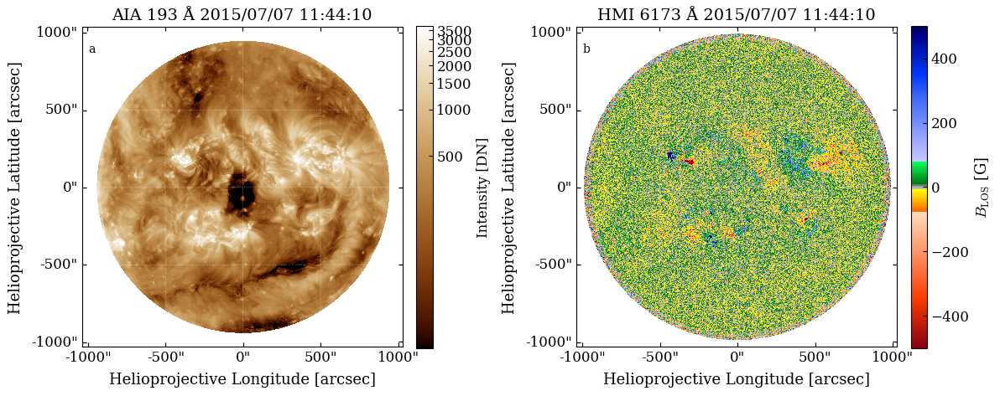

In [12]:
# ApJ-uniform global
plt.rcParams.update({
    "font.family": "serif",
    "mathtext.fontset": "cm",
    "xtick.direction": "in",
    "ytick.direction": "in",
})

# Create the figure
fig = plt.figure(figsize=(12,6))

# ---------------- AIA 193 Å ----------------
ax1 = fig.add_subplot(121, projection=aia_reprojected.wcs)
im1 = aia_reprojected.plot(axes=ax1, clip_interval=(1, 99.9) * u.percent)

ax1.set_title("AIA 193 Å 2015/07/07 11:44:10", fontsize=14, fontfamily="serif")

cb1 = fig.colorbar(im1, ax=ax1, orientation='vertical', fraction=0.046, pad=0.04)
cb1.set_label("Intensity [DN]", fontsize=12, fontfamily="serif")
cb1.ax.tick_params(labelsize=12)

ax1.coords[0].set_axislabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax1.coords[1].set_axislabel("Helioprojective Latitude [arcsec]", fontsize=13)

# Force uniform font on axis labels (works on all versions)
ax1.set_xlabel("Helioprojective Longitude [arcsec]", fontsize=13, fontfamily="serif")
ax1.set_ylabel("Helioprojective Latitude [arcsec]", fontsize=13, fontfamily="serif")

ax1.tick_params(labelsize=12)
ax1.invert_xaxis()
ax1.invert_yaxis()
ax1.text(0.02, 0.95, "a", transform=ax1.transAxes,
         va="top", ha="left", fontfamily="serif")

# ---------------- HMI 6173 Å ----------------
ax2 = fig.add_subplot(122, projection=hmi6173.wcs)
im2 = hmi6173.plot(axes=ax2, cmap="hmimag", norm=Normalize(-500, 500))

ax2.set_title("HMI 6173 Å 2015/07/07 11:44:10", fontsize=14, fontfamily="serif")

cb2 = fig.colorbar(im2, ax=ax2, orientation='vertical', fraction=0.046, pad=0.04)
cb2.set_label(r"$B_{\mathrm{LOS}}$ [G]", fontsize=13, fontfamily="serif")
cb2.ax.tick_params(labelsize=12)

ax2.coords[0].set_axislabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax2.coords[1].set_axislabel("Helioprojective Latitude [arcsec]", fontsize=13)

# Force uniform font on axis labels (works on all versions)
ax2.set_xlabel("Helioprojective Longitude [arcsec]", fontsize=13, fontfamily="serif")
ax2.set_ylabel("Helioprojective Latitude [arcsec]", fontsize=13, fontfamily="serif")

ax2.tick_params(labelsize=12)
ax2.invert_xaxis()
ax2.invert_yaxis()
ax2.text(0.02, 0.95, "b", transform=ax2.transAxes,
         va="top", ha="left", fontfamily="serif")

plt.tight_layout(pad=1.0)
plt.show()

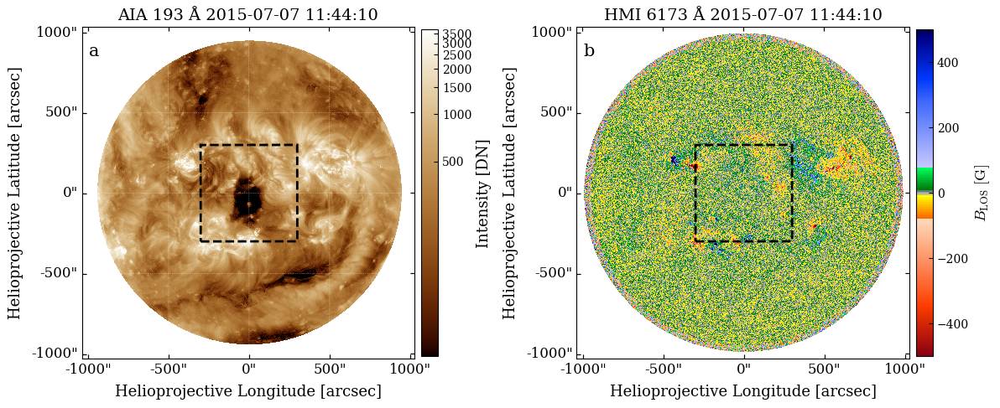

In [13]:
# Define corners in the AIA coordinate frame (matches HMI via reprojection)
aia_bottom_left = SkyCoord(-300 * u.arcsec, -300 * u.arcsec,
                           frame=aia_reprojected.coordinate_frame)
aia_top_right   = SkyCoord( 300 * u.arcsec,  300 * u.arcsec,
                           frame=aia_reprojected.coordinate_frame)

# Create figure
fig = plt.figure(figsize=(12, 6))

# ===================== AIA Plot =====================
ax1 = fig.add_subplot(121, projection=aia_reprojected.wcs)
im1 = aia_reprojected.plot(axes=ax1, clip_interval=(1, 99.9) * u.percent)

aia_reprojected.draw_quadrangle(
    bottom_left=aia_bottom_left,
    top_right=aia_top_right,
    axes=ax1,
    edgecolor="black",
    linestyle="--",
    linewidth=2
)

ax1.set_title("AIA 193 Å 2015-07-07 11:44:10", fontsize=14)

ax1.coords[0].set_axislabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax1.coords[1].set_axislabel("Helioprojective Latitude [arcsec]", fontsize=13)

# enforce uniform font (old Astropy-safe)
ax1.set_xlabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax1.set_ylabel("Helioprojective Latitude [arcsec]", fontsize=13)

ax1.tick_params(labelsize=12)
ax1.invert_xaxis()
ax1.invert_yaxis()

cbar1 = fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.02)
cbar1.set_label("Intensity [DN]", fontsize=13)
cbar1.ax.tick_params(labelsize=10)

ax1.text(0.02, 0.95, "a", transform=ax1.transAxes,
         va="top", ha="left", fontsize=15)

# ===================== HMI Plot =====================
ax2 = fig.add_subplot(122, projection=hmi6173.wcs)
im2 = hmi6173.plot(axes=ax2, cmap="hmimag", norm=Normalize(-500, 500))

hmi6173.draw_quadrangle(
    bottom_left=aia_bottom_left,
    top_right=aia_top_right,
    axes=ax2,
    edgecolor="black",
    linestyle="--",
    linewidth=2
)

ax2.set_title("HMI 6173 Å 2015-07-07 11:44:10", fontsize=14)

ax2.coords[0].set_axislabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax2.coords[1].set_axislabel("Helioprojective Latitude [arcsec]", fontsize=13)

# enforce uniform font (old Astropy-safe)
ax2.set_xlabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax2.set_ylabel("Helioprojective Latitude [arcsec]", fontsize=13)

ax2.tick_params(labelsize=12)
ax2.invert_xaxis()
ax2.invert_yaxis()

cbar2 = fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.02)
cbar2.set_label(r"$B_{\mathrm{LOS}}\ \mathrm{[G]}$", fontsize=13)
cbar2.ax.tick_params(labelsize=10)

ax2.text(0.02, 0.95, "b", transform=ax2.transAxes,
         va="top", ha="left", fontsize=15)

# Final layout and save
plt.tight_layout(pad=1.0)
plt.savefig("/Users/khagendrakatwal/Desktop/Figure_1_AIA_HMI_Aligned_ROI_map1.pdf",
            dpi=600, bbox_inches="tight")
plt.show()

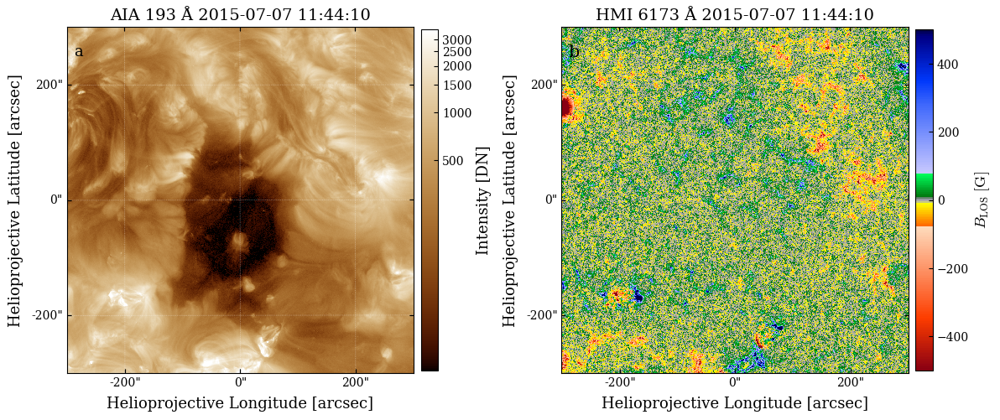

In [14]:
# Create submaps from defined region
aia_sub  = aia_reprojected.submap(bottom_left=aia_bottom_left, top_right=aia_top_right)
hmi_sub1 = hmi6173.submap(bottom_left=aia_bottom_left, top_right=aia_top_right)

# Plot submaps
fig = plt.figure(figsize=(12, 6))

# ===================== AIA submap =====================
ax1 = fig.add_subplot(121, projection=aia_sub.wcs)
im1 = aia_sub.plot(axes=ax1, clip_interval=(1, 99.9) * u.percent)

ax1.set_title("AIA 193 Å 2015-07-07 11:44:10", fontsize=14)

ax1.coords[0].set_axislabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax1.coords[1].set_axislabel("Helioprojective Latitude [arcsec]", fontsize=13)

# enforce uniform label font (old Astropy-safe)
ax1.set_xlabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax1.set_ylabel("Helioprojective Latitude [arcsec]", fontsize=13)

ax1.tick_params(labelsize=10)
ax1.invert_xaxis()
ax1.invert_yaxis()

cbar1 = fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.02)
cbar1.set_label("Intensity [DN]", fontsize=13)
cbar1.ax.tick_params(labelsize=10)

ax1.text(0.02, 0.95, "a", transform=ax1.transAxes, va="top", ha="left", fontsize=13)

# ===================== HMI submap =====================
ax2 = fig.add_subplot(122, projection=hmi_sub1.wcs)
im2 = hmi_sub1.plot(axes=ax2, cmap="hmimag", norm=Normalize(-500, 500))

ax2.set_title("HMI 6173 Å 2015-07-07 11:44:10", fontsize=14)

ax2.coords[0].set_axislabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax2.coords[1].set_axislabel("Helioprojective Latitude [arcsec]", fontsize=13)

# enforce uniform label font (old Astropy-safe)
ax2.set_xlabel("Helioprojective Longitude [arcsec]", fontsize=13)
ax2.set_ylabel("Helioprojective Latitude [arcsec]", fontsize=13)

ax2.tick_params(labelsize=10)
ax2.invert_xaxis()
ax2.invert_yaxis()

cbar2 = fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.02)
cbar2.set_label(r"$B_{\mathrm{LOS}}\ \mathrm{[G]}$", fontsize=13)
cbar2.ax.tick_params(labelsize=10)

ax2.text(0.02, 0.95, "b", transform=ax2.transAxes, va="top", ha="left", fontsize=15)

# Final layout and show/save
plt.tight_layout(pad=1.0)
# plt.savefig("/Users/khagendrakatwal/Desktop/AIA_HMI_submaps.pdf", dpi=600, bbox_inches="tight")
plt.show()


# Coronal holes detection base on intensity threshold

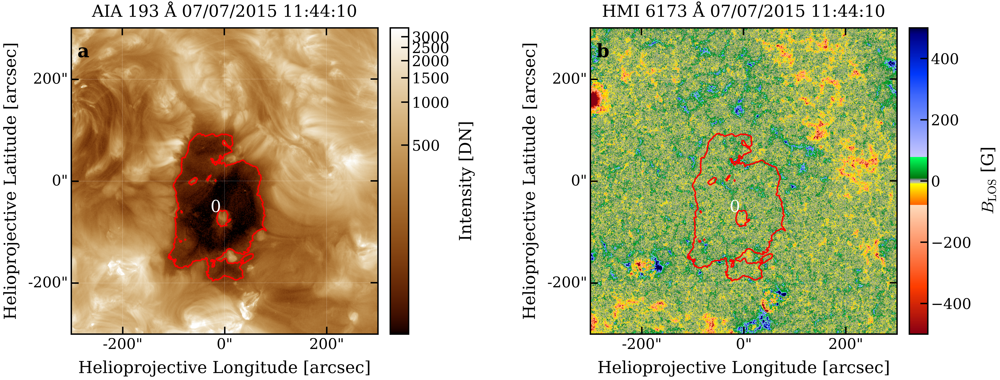

In [37]:
# -----------------------------
# Mask from AIA + largest region
# -----------------------------
segmented = aia_sub.data < 100
smoothed_mask = gaussian_filter(segmented.astype(float), sigma=2) > 0.5

labeled = label(smoothed_mask)
regions = regionprops(labeled, intensity_image=hmi_sub1.data)
if len(regions) == 0:
    raise RuntimeError("No regions found in mask. Try changing the threshold or sigma.")

regions = sorted(regions, key=lambda r: r.area, reverse=True)

largest_region = regions[0]
single_mask = labeled == largest_region.label
y, x = largest_region.centroid  # (row, col)

# -----------------------------
# Figure
# -----------------------------
fig = plt.figure(figsize=(18.5, 6), dpi=600)

# Left: AIA map
ax1 = fig.add_subplot(121, projection=aia_sub.wcs)
im1 = aia_sub.plot(axes=ax1, clip_interval=(1, 99.9) * u.percent)
ax1.contour(single_mask, levels=[0.5], colors="red")
ax1.text(x, y, "0", color="white", ha="center", va="center", fontsize=18)

ax1.set_title("AIA 193 Å 07/07/2015 11:44:10", fontsize=18)
ax1.set_xlabel("Helioprojective Longitude [arcsec]", fontsize=18)
ax1.set_ylabel("Helioprojective Latitude [arcsec]", fontsize=18)
ax1.tick_params(labelsize=16, direction="in")
ax1.invert_xaxis()
ax1.invert_yaxis()
ax1.text(0.02, 0.95, "a", transform=ax1.transAxes,
         fontsize=20, fontweight="bold", va="top", ha="left")

# Right: HMI map
ax2 = fig.add_subplot(122, projection=hmi_sub1.wcs)
im2 = hmi_sub1.plot(axes=ax2, cmap="hmimag", norm=Normalize(-500, 500))
ax2.contour(single_mask, levels=[0.5], colors="red")
ax2.text(x, y, "0", color="white", ha="center", va="center", fontsize=18)

ax2.set_title("HMI 6173 Å 07/07/2015 11:44:10", fontsize=18)
ax2.set_xlabel("Helioprojective Longitude [arcsec]", fontsize=18)
ax2.set_ylabel("Helioprojective Latitude [arcsec]", fontsize=18)
ax2.tick_params(labelsize=16, direction="in")
ax2.invert_xaxis()
ax2.invert_yaxis()
ax2.text(0.02, 0.95, "b", transform=ax2.transAxes,
         fontsize=20, fontweight="bold", va="top", ha="left")

# -----------------------------
# External colorbars (no extra variables)
# -----------------------------
pos1 = ax1.get_position()
cax1 = fig.add_axes([pos1.x1 + 0.01, pos1.y0, 0.015, pos1.height])
cbar1 = fig.colorbar(im1, cax=cax1)
cbar1.set_label("Intensity [DN]", fontsize=18)
cbar1.ax.tick_params(labelsize=16)

pos2 = ax2.get_position()
cax2 = fig.add_axes([pos2.x1 + 0.01, pos2.y0, 0.015, pos2.height])
cbar2 = fig.colorbar(im2, cax=cax2)
cbar2.set_label(r"$B_{\mathrm{LOS}}$ [G]", fontsize=18)
cbar2.ax.tick_params(labelsize=16)

# Spacer to keep bbox_inches="tight" from cropping unevenly
pos2_new = ax2.get_position()
spax = fig.add_axes([pos2_new.x1 + 0.01, pos2_new.y0, 0.015, pos2_new.height])
spax.axis("off")

plt.show()

In [38]:
# Create mask from largest region
bbox = regions[0].bbox
mask = np.ones_like(hmi_sub1.data, dtype=bool)
mask[bbox[0]: bbox[2], bbox[1]: bbox[3]] = ~regions[0].image

# Create masked SunPy map
hmi_masked = sunpy.map.Map((hmi_sub1.data, hmi_sub1.meta), mask=mask)

# Coronal hole magnetic map and Histogram

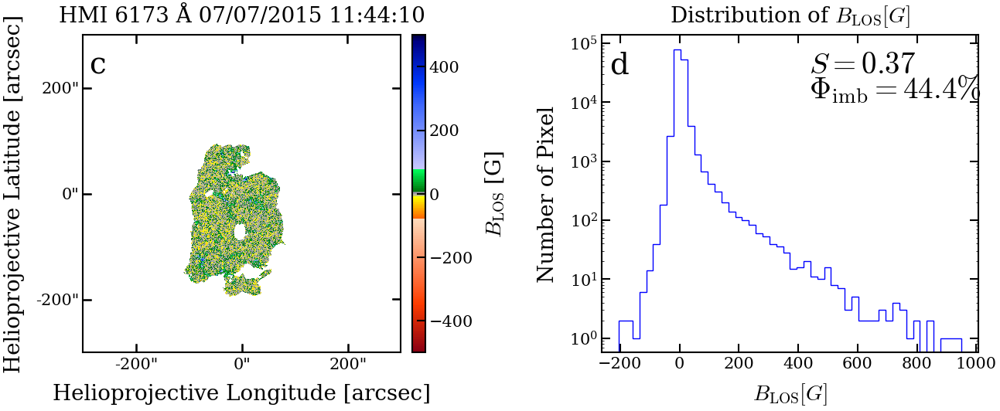

In [39]:
# Extract unmasked data
unmasked_data = hmi_masked.data[~hmi_masked.mask]

# Create figure with two subplots
fig = plt.figure(figsize=(14, 6))

# Masked HMI Map
ax1 = fig.add_subplot(121, projection=hmi_masked)
im = hmi_masked.plot(axes=ax1, cmap="hmimag", norm=Normalize(-500, 500))
ax1.set_title("HMI 6173 Å 07/07/2015 11:44:10")
ax1.set_xlabel("Helioprojective Longitude [arcsec]")
ax1.set_ylabel("Helioprojective Latitude [arcsec]")
ax1.tick_params()
ax1.invert_xaxis()
ax1.invert_yaxis()

# Colorbar for map
cbar1 = fig.colorbar(im, ax=ax1, pad=0.03, fraction=0.046, aspect=25)
cbar1.set_label(r"$B_{\mathrm{LOS}}$ [G]")
cbar1.ax.tick_params()

# Histogram
ax2 = fig.add_subplot(122)
ax2.hist(unmasked_data, bins=50, histtype='step', color='blue')
ax2.set_yscale('log')
ax2.set_xlabel(r"$B_{\mathrm{LOS}}[G]$")
ax2.set_ylabel('Number of Pixel')
ax2.set_title(r"Distribution of $B_{\mathrm{LOS}}[G]$")
ax2.tick_params()

# Move annotations to upper-right (FIXED Phi_imb symbol)
ax2.text(0.55, 0.95, r"$S = 0.37$", transform=ax2.transAxes, verticalalignment='top')
ax2.text(0.55, 0.88, r"$\Phi_{\mathrm{imb}} = 44.4\%$",
         transform=ax2.transAxes, verticalalignment='top')

# Add panel labels
ax1.text(0.02, 0.95, 'c', transform=ax1.transAxes, va='top', ha='left')
ax2.text(0.02, 0.95, 'd', transform=ax2.transAxes, va='top', ha='left')

# Layout and show
plt.tight_layout(pad=1.0)
plt.show()

### Skewness of Magnetic Field Distribution
$$
\text{Skewness} = \frac{3(\mu - M)}{\sigma}
$$
**Where:**

- $\mu$ = Mean of the magnetic field values  
- $M$ = Median of the magnetic field values  
- $\sigma$ = Standard deviation of the magnetic field values






In [40]:
def Skewness(region_map):
    mean = np.nanmean(region_map)
    median = np.nanmedian(region_map)
    std = np.nanstd(region_map)
    skewness = 3 * (mean - median) / std
    return skewness

# Extract unmasked magnetic field values from the masked HMI map
magnetic_field_values = hmi_masked.data[~hmi_masked.mask]

# Calculate skewness
skewness = Skewness(magnetic_field_values)

print(f"Skewness of LOS magnetic field in the coronal hole region: {skewness:.3f}")


Skewness of LOS magnetic field in the coronal hole region: 0.373


### Magnetic Flux Imbalance
$$
\text{Flux Imbalance}~(\%) = 
\left( 
\frac{
\left| \sum\limits_{i=1}^{N} B_i^+ - \sum\limits_{i=1}^{N} B_i^- \right|
}{
\left| \sum\limits_{i=1}^{N} B_i^+ \right| + \left| \sum\limits_{i=1}^{N} B_i^- \right|
}
\right) \times 100\%
$$

Where:

$B_i^+$ = Positive (outward) magnetic field values  
$B_i^-$ = Negative (inward) magnetic field values  
$N$ = Total number of pixels  


## SOURCE

We use the magnetic flux imbalance formula as described in:
- Wiegelmann & Solanki (2004)
- Abramenko et al. (2009)
- Hofmeister et al. (2017)

These works establish that coronal holes exhibit significant unipolarity, quantified by comparing net and total magnetic fluxes.


In [41]:
 def calculate_flux_imbalance(data):
    """
    Calculate the flux imbalance and flux percentages based on magnetic field data.

    Parameters:
        data (numpy.ndarray): Array containing magnetic field data.

    Returns:
        tuple: Flux imbalance percentage, positive flux percentage, negative flux percentage.
    """
    positive_data = data[data > 0]
    negative_data = data[data < 0]

    total_positive_flux = np.sum(positive_data)
    total_negative_flux = np.sum(np.abs(negative_data))  # Take absolute value of negative data
    
    total_flux = total_positive_flux + total_negative_flux
    flux_imbalance_percentage = (abs(total_positive_flux - total_negative_flux) / total_flux) * 100
    
    positive_flux_percentage = (total_positive_flux / total_flux) * 100
    negative_flux_percentage = (total_negative_flux / total_flux) * 100
    
    return flux_imbalance_percentage, positive_flux_percentage, negative_flux_percentage

# hmi_masked.data[~hmi_masked.mask] contains the magnetic field data
data = magnetic_field_values

imbalance_flux_percentage, positive_flux_percentage, negative_flux_percentage = calculate_flux_imbalance(data)
print("Flux Imbalance Percentage:", imbalance_flux_percentage)
print("Positive Flux Percentage:", positive_flux_percentage)
print("Negative Flux Percentage:", negative_flux_percentage)

Flux Imbalance Percentage: 44.29226019584455
Positive Flux Percentage: 72.14613009792228
Negative Flux Percentage: 27.853869902077722


## Acknowledgments

This notebook uses [SunPy](https://sunpy.org), an open-source Python package for solar physics. We acknowledge the SunPy Project and its community:

- SunPy Community et al. (2015)
- Mumford et al. (2020)
- The SunPy Community et al. (2023)


# Sanity Check of Polarity

$$
\gamma = \frac{1}{N} \sum_{j=1}^{N} \left( \frac{\phi_j - \bar{\phi}}{\sigma} \right)^3
$$

Where:

$\gamma$ = Skewness  
$N$ = Total number of pixels in the region  
$\phi_j$ = Magnetic flux value at pixel $j$  
$\bar{\phi}$ = Mean of all magnetic flux values (average field)  
$\sigma$ = Standard deviation of the magnetic flux values

Source: Lowder et al. (2014)


In [42]:
# Compute the mean and standard deviation
mean_phi = np.mean(magnetic_field_values)
std_phi = np.std(magnetic_field_values)

# Total number of pixels
N = len(magnetic_field_values)

# Compute skewness manually (as per definition)
skewness = (1 / N) * np.sum(((magnetic_field_values - mean_phi) / std_phi) ** 3)

print(f"Skewness (γ): {skewness:.3f}")


Skewness (γ): 10.071


Lowder et al. (2014)

Good !! We got the same polarity.

# $$
U = \frac{\mathrm{avg}\left(|B_{\mathrm{LOS}}|\right) - \left|\mathrm{avg}\left(B_{\mathrm{LOS}}\right)\right|}{\mathrm{avg}\left(|B_{\mathrm{LOS}}|\right)}
$$

Where:

$U$ = Degree of unipolarity  
$B_{\mathrm{LOS}}$ = Line-of-sight magnetic field values  
$\mathrm{avg}(|B_{\mathrm{LOS}}|)$ = Mean of the absolute magnetic field values  
$|\mathrm{avg}(B_{\mathrm{LOS}})|$ = Absolute value of the mean magnetic field  

Source: Reiss et al. (2021)


In [43]:
def degree_of_unipolarity(Magnetic_field_values):
    """
    Compute the degree of unipolarity (U) for magnetic field values.

    Parameters
    ----------
    Magnetic_field_values : array_like
       

    Returns
    -------
    float
        Degree of unipolarity U (between 0 and 1).
    """
    B = np.asarray( Magnetic_field_values).flatten()
    avg_abs = np.mean(np.abs(B))
    abs_avg = np.abs(np.mean(B))
    
    if avg_abs == 0:
        return np.nan  # Avoid division by zero
    
    U = (avg_abs - abs_avg) / avg_abs
    return U

U_value = degree_of_unipolarity(magnetic_field_values)
print(f"Degree of unipolarity: {U_value:.3f}")

Degree of unipolarity: 0.557


Good !! same polarity 

# Sanity Check for magnetic flux imabalance 

In [44]:
import numpy as np

def flux_imbalance_percent(magnetic_field_values):
    """
    Calculate the magnetic-flux imbalance Φ_FI [%].

    Φ_FI = |Σ B_i| / Σ |B_i| × 100

    Parameters
    ----------
    magnetic_field_values : 1-D numpy array
        Line-of-sight magnetic-field values (e.g., Gauss) for the region.

    Returns
    -------
    float
        Flux-imbalance percentage [%].  0 % ⇒ perfectly balanced, 100 % ⇒ totally one-sided.
    """
    B = np.asarray(magnetic_field_values).flatten()
    B = B[~np.isnan(B)]                    # drop NaNs if present

    unsigned_sum = np.sum(np.abs(B))       # Σ |B_i|
    signed_sum   = np.abs(np.sum(B))       # |Σ  B_i|

    if unsigned_sum == 0:                  # avoid divide-by-zero
        return np.nan

    phi_fi = (signed_sum / unsigned_sum) * 100.0
    return phi_fi

fi_percent = flux_imbalance_percent(magnetic_field_values)
print(f"Flux imbalance = {fi_percent:.2f} %")

Flux imbalance = 44.29 %


In [45]:
def percentage_unbalanced_flux(magnetic_field_values, A_values=None):
    """
    Calculate the percentage unbalanced magnetic flux:
    Φ_pu = |Σ A_i * B_i| / Σ |A_i * B_i| × 100

    Parameters
    ----------
        Magnetic_field_values: array_like
        Magnetic field values (e.g., B_LOS) in Gauss.
        A_values : array_like or None
        Pixel areas. If None, assumes equal area per pixel.

    Returns
    -------
    float
        Percentage unbalanced magnetic flux [%].
    """
    B = np.asarray(magnetic_field_values.flatten())
    if A_values is None:
        A = np.ones_like(B)
    else:
        A = np.asarray(A_values).flatten()
        if A.shape != B.shape:
            raise ValueError("A_values and B_values must have the same shape.")

    AB = A * B
    numerator = np.abs(np.sum(AB))
    denominator = np.sum(np.abs(AB))

    if denominator == 0:
        return np.nan

    return (numerator / denominator) * 100

phi_pu_percent = percentage_unbalanced_flux(magnetic_field_values)
print(f"Percentage unbalanced magnetic flux: {phi_pu_percent:.2f}%")

Percentage unbalanced magnetic flux: 44.29%


Good !!

Thanks!